# Overview

In this notebook I develop the code ncessary to resample the training data so that it more accurately approximates the data we're working with in this project, Planet's three meter imagery.

In [ ]:
# Imports here
import os

from google.cloud import storage

# Create the service client.
from googleapiclient.discovery import build
from apiclient.http import MediaIoBaseDownload

In [ ]:
# GOOGLE CREDS is different for notebook – change for .py files
GOOGLE_APPLICATION_CREDENTIALS = os.getenv('GOOGLE_APPLICATION_CREDENTIALS')
BUCKET_NAME = os.getenv('BUCKET_NAME')
GEO_FILTER_PATH = os.getenv('GEO_FILTER_PATH')
PATH_PREFIX = os.getenv('PATH_PREFIX')
ORDER_ID = os.getenv('ORDER_ID')
ITEM_TYPE = os.getenv('ITEM_TYPE')
ITEM_ID_PATH = os.getenv('ITEM_ID_PATH')
DL_IMAGE_PATH = os.getenv('DL_IMAGE_PATH')
BAND_ID = os.getenv('BAND_ID')

In [ ]:
def download_img(dl_path, id_num):
    gcs_service = build('storage', 'v1')
    if not os.path.exists(os.path.dirname(dl_path)):
        try:
            os.makedirs(os.path.dirname(dl_path))
        except OSError as exc: # Guard against race condition
            if exc.errno != errno.EEXIST:
                raise
    with open(dl_path, 'wb') as f:
      # Download the file from the Google Cloud Storage bucket.
      request = gcs_service.objects().get_media(bucket=BUCKET_NAME,
                                                object=dl_path)
      media = MediaIoBaseDownload(f, request)
      print('Downloading image ', id_num, '...')
      print('Download Progress: ')
      done = False
      while not done:
          prog, done = media.next_chunk()
          print(prog.progress())

    print('Image ', id_num, ' downloaded.')
    return dl_path

In [ ]:
dl_path = r'lima/2a2ca315-88af-4c4f-be1d-befdab5ce7fa/PSScene4Band/20161204_181909_0d06_3B_AnalyticMS.tif'
filepath = download_img(dl_path, id_num=0)

Download Progress: 
1.0
Image  0  downloaded.


In [ ]:
from PIL import Image, ImageFilter, ImageShow

In [ ]:
img_path = r'/content/0005d01c8.jpg'
img = Image.open(img_path)

In [ ]:
img_blurred = img.filter(ImageFilter.GaussianBlur())

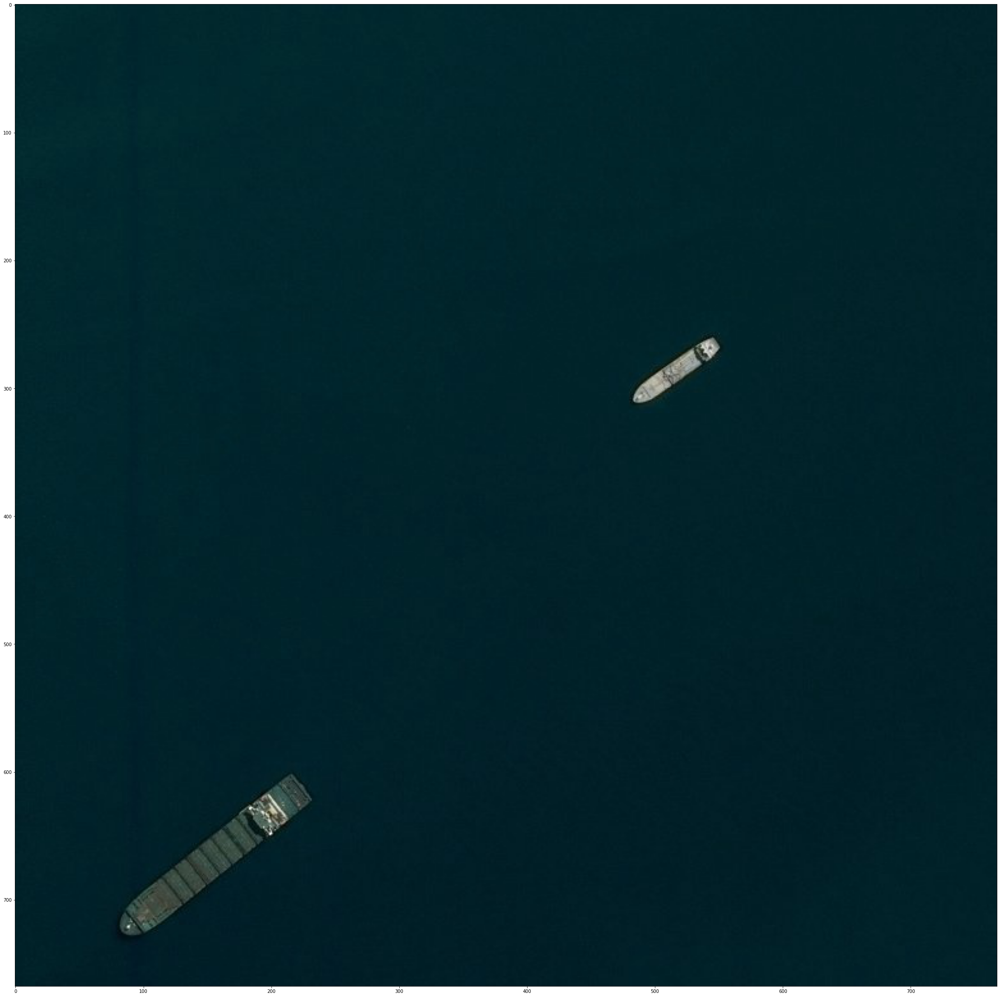

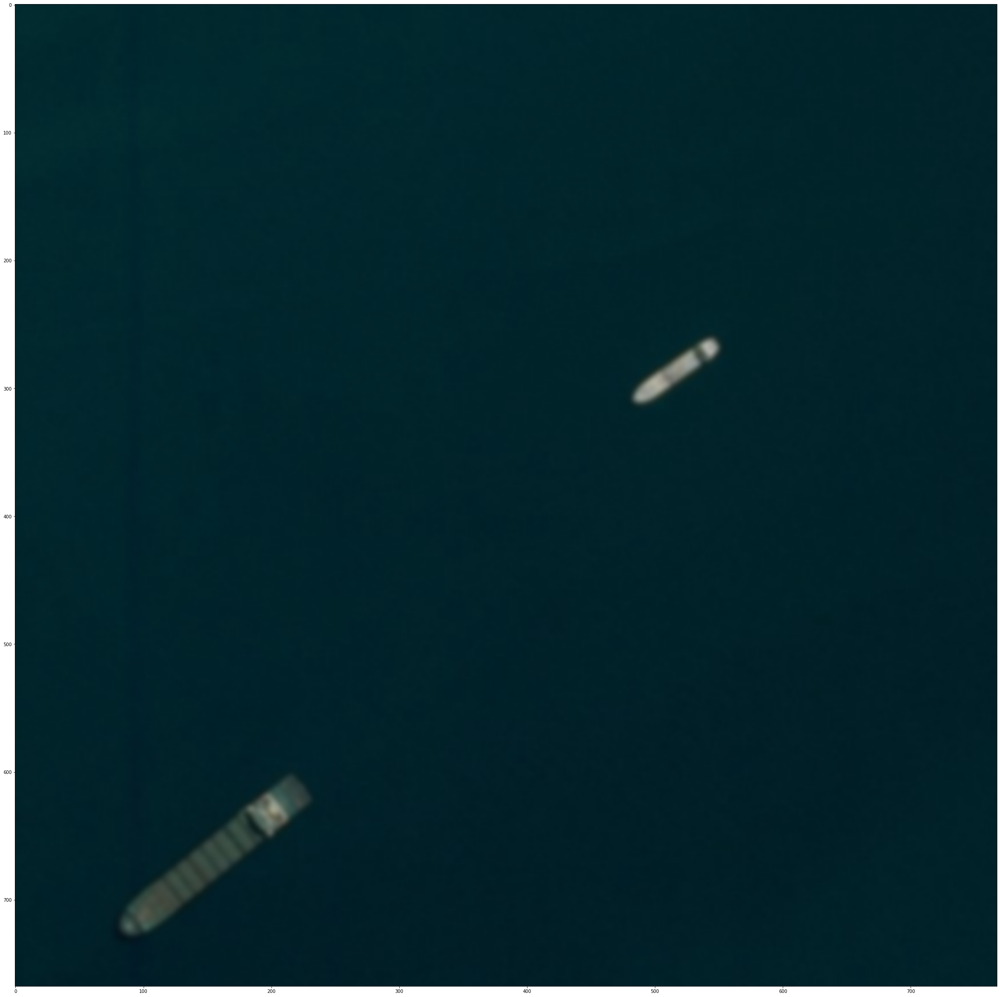

In [ ]:
import matplotlib.pyplot as plt

# Original
# Create figure and axes
fig,ax = plt.subplots(1, figsize=(40,40))
# Display the image
ax.imshow(img)
plt.show()

# Create figure and axes
fig,ax = plt.subplots(1, figsize=(40,40))
# Display the image
ax.imshow(img_blurred)
plt.show()

In [ ]:
img_path = r'/content/0017c19d6.jpg'
img = Image.open(img_path)

In [ ]:
img_blurred = img.filter(ImageFilter.GaussianBlur())

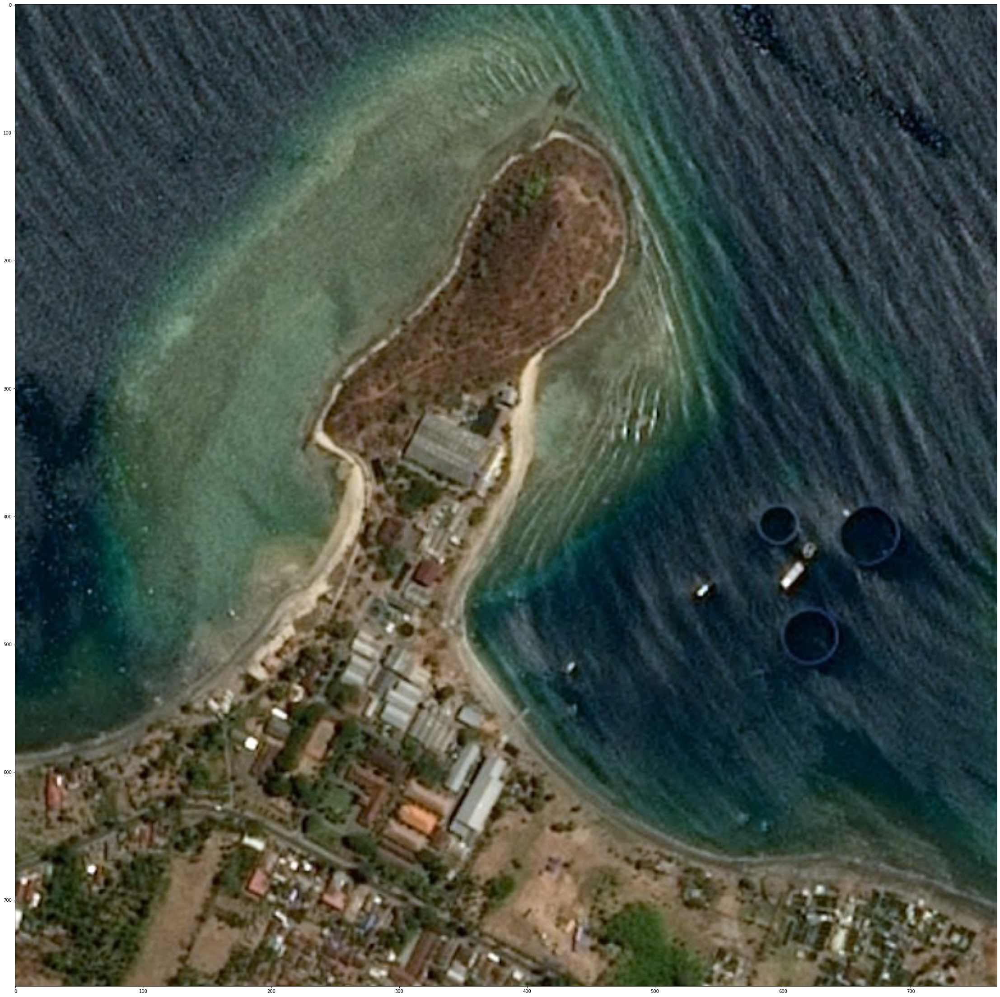

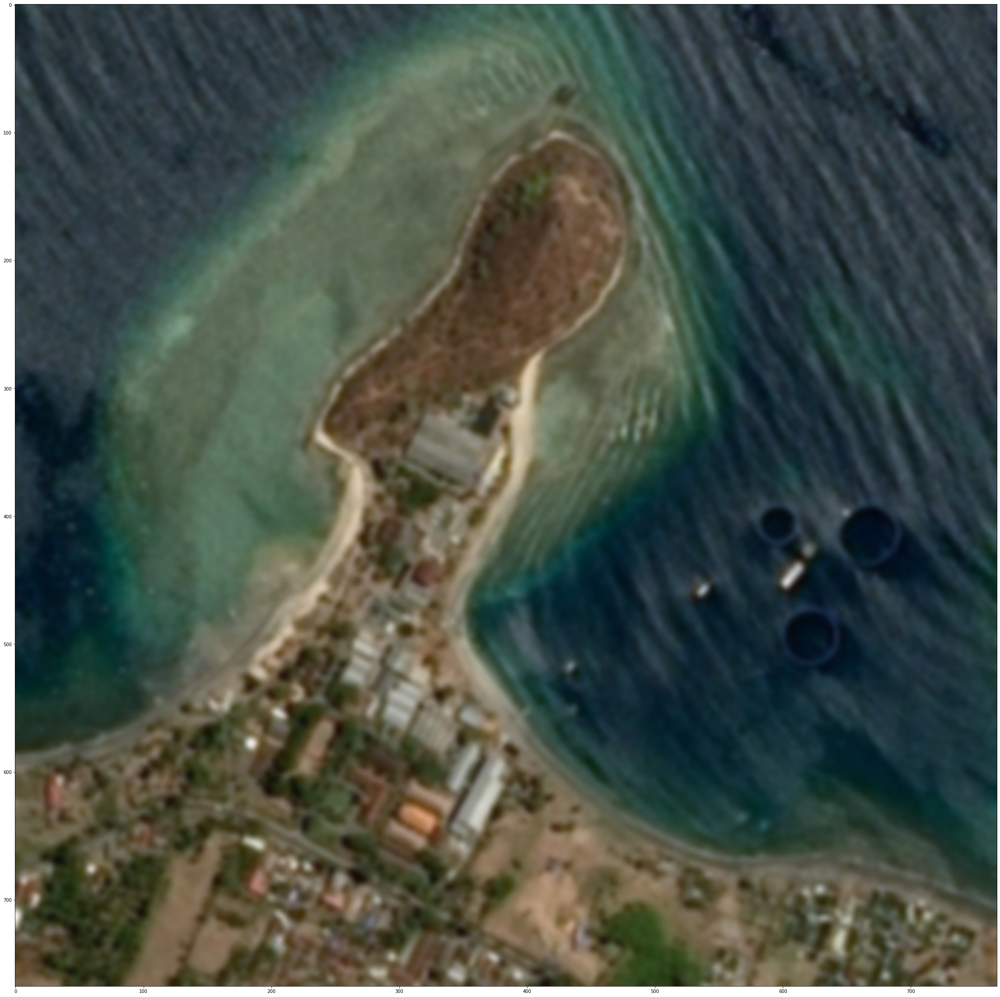

In [ ]:
import matplotlib.pyplot as plt

# Original
# Create figure and axes
fig,ax = plt.subplots(1, figsize=(40,40))
# Display the image
ax.imshow(img)
plt.show()

# Create figure and axes
fig,ax = plt.subplots(1, figsize=(40,40))
# Display the image
ax.imshow(img_blurred)
plt.show()

## Convert image to array




In [ ]:
import numpy as np


img_array = np.asarray(img)

In [ ]:
img_array.shape

(768, 768, 3)

## Modify `ShipDataset`

In [ ]:
import numpy as np

from PIL import Image, ImageFilter, ImageShow


class ShipDataset(Dataset):
    def __init__(self, in_df, transforms=None, mode='train'):
        grp = list(in_df.groupby('ImageId'))
        self.image_ids =  [_id for _id, _ in grp] 
        self.image_masks = [m['EncodedPixels'].values for _,m in grp]
        self.transforms = transforms
        self.mode = mode


    def __len__(self):
        return len(self.image_ids)
               
        
    def __getitem__(self, idx):
        img_file_name = self.image_ids[idx]
        in_mask_list = self.image_masks[idx]
        N = sum([1 for i in in_mask_list if isinstance(i, str)])
        if N > 0:
            for i, rle in enumerate(in_mask_list):
                if not is_valid(rle):
                    if N > 1:
                        N -= 1
                        in_mask_list = np.delete(in_mask_list, i)
                    else:
                        return self.__getitem__(np.random.randint(0, high=len(self)))

        if self.mode == 'train':
            rgb_path = os.path.join(train_image_dir, img_file_name)
        else:
            rgb_path = os.path.join(test_image_dir, img_file_name)

        image = Image.open(rgb_path)
        # Blur image to better match lower res imagery
        image_blurred = image.filter(ImageFilter.GaussianBlur())
        image = np.asarray(image_blurred)


        # Make target dict
        target = make_target(in_mask_list, N, shape=(768,768))
        
        # Make image_id
        image_id = torch.tensor([idx])
        target["image_id"] = image_id
               
        if self.transforms is not None:
            image, mask = self.transforms(image, target)

        return image, target

NameError: ignored

## Directly blur images in target directory

This is much more efficient than blurring each image in every epoch

In [ ]:
from pathlib import Path


def blur_jpgs(srcpath, destpath):
    pathlist = Path(srcpath).glob('**/*.jpg')
    for path in pathlist:
        # because path is object not string
        path_in_str = str(path)
        image = Image.open(path_in_str)
        # Blur image to better match lower res imagery
        image_blurred = image.filter(ImageFilter.GaussianBlur())

        img_name = path.name
        savepath = destpath + '/' + img_name
        if not os.path.exists(os.path.dirname(savepath)):
            try:
                os.makedirs(os.path.dirname(savepath))
            except OSError as exc: # Guard against race condition
                if exc.errno != errno.EEXIST:
                    raise
        image_blurred.save(savepath)


In [ ]:
srcpath = r'/content/srcdir'
destpath = r'/content/destdir'

blur_jpgs(srcpath, destpath)